# Forecasting metrics: case 4

In this notebooks forecast metrics for all models fitted for the simulation case 4 are calculated and saved to a single file.

In [2]:
import os
import sys
import pickle

import tensorflow as tf
import pandas as pd
import numpy as np

src_path = os.path.dirname(os.path.dirname(os.path.dirname(os.getcwd())))
sys.path.append(src_path)

from Metrics.metrics import get_model_metrics
from DataSimulation.utils import plot_fit
from Transformers.model import Forecaster


## Data

In [3]:
case = "case_4"
case_path = os.path.join(src_path, "Notebooks", "data_generation_and_models_fitting", case)

In [4]:
data = pd.read_csv(os.path.join(case_path, 'data.csv'), header=None)
data.head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,2.0,173.0,143.0,11.0,2.0,937.0,81.0,52.0,27.0,20.0,...,11.0,43.0,15.0,56.0,155.0,1.0,2.0,3.0,82.0,8.0
1,1.0,267.0,104.0,3.0,2.0,43.0,36.0,7.0,23.0,10.0,...,12.0,4.0,8.0,28.0,13.0,0.0,7.0,4.0,65.0,10.0
2,5.0,102.0,73.0,12.0,1.0,714.0,35.0,44.0,29.0,3.0,...,16.0,22.0,29.0,42.0,13.0,0.0,1.0,3.0,87.0,20.0
3,11.0,115.0,100.0,5.0,0.0,2662.0,15.0,38.0,22.0,10.0,...,12.0,15.0,16.0,67.0,9.0,1.0,2.0,3.0,67.0,28.0
4,0.0,73.0,137.0,9.0,0.0,1063.0,73.0,77.0,29.0,5.0,...,10.0,24.0,13.0,25.0,45.0,4.0,1.0,1.0,79.0,26.0


In [5]:
test_size = 4*24
train_data = data.iloc[:-test_size, :].to_numpy()
test_data = data.iloc[-test_size:, :].to_numpy()
num_vars = train_data.shape[-1]
print(train_data.shape)
print(test_data.shape)

(904, 100)
(96, 100)


In [6]:
metrics = {}
metrics_statistics = {}

## Sarima model

In [7]:
with open(os.path.join(case_path, "sarima.pkl"), "rb") as file:
    sarima_model = pickle.load(file)

In [8]:
sarima_prediction = sarima_model.predict(test_size)

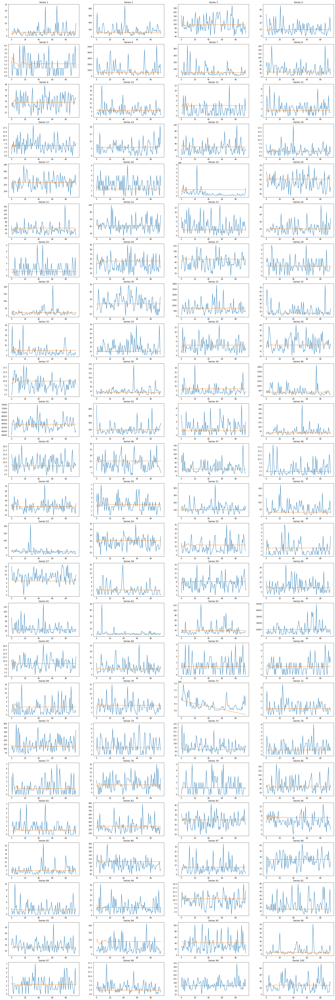

In [9]:
plot_fit(test_data, sarima_prediction, predicted=True, cols=4)

In [10]:
sarima_metrics, sarima_statistics = get_model_metrics(
    test_data=test_data,
    predicted_values=sarima_prediction,
    train_data=train_data,
    m=1,
    model_name="sarima",
    case=case
)
metrics.update(sarima_metrics)
metrics_statistics.update(sarima_statistics)

## Poisson Autoregression model

In [11]:
with open(os.path.join(case_path, "poisson_autoregression.pkl"), "rb") as file:
    poisson_ar_model = pickle.load(file)

In [12]:
poisson_ar_prediction = poisson_ar_model.predict(test_size)

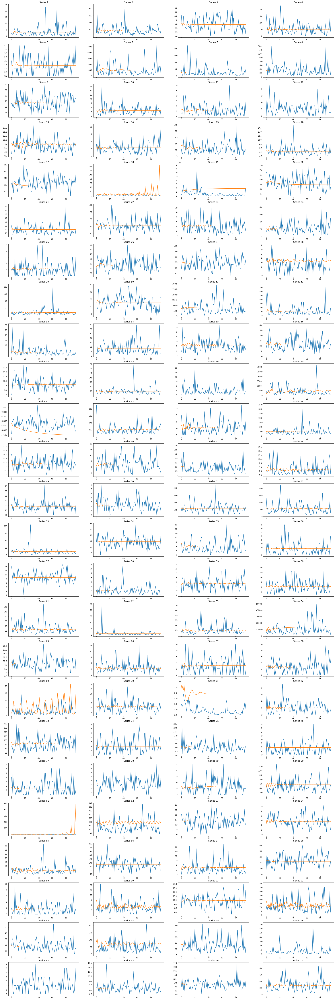

In [13]:
plot_fit(test_data, poisson_ar_prediction, predicted=True, cols=4)

In [14]:
p_ar_metrics, p_ar_statistics = get_model_metrics(
    test_data=test_data,
    predicted_values=poisson_ar_prediction,
    train_data=train_data,
    m=1,
    model_name="poisson_autorregression",
    case=case
)
metrics.update(p_ar_metrics)
metrics_statistics.update(p_ar_statistics)

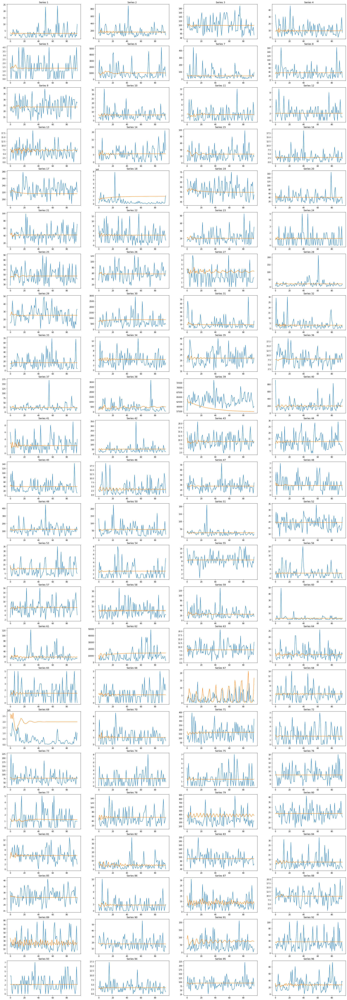

In [15]:
selector = [x for x in range(test_data.shape[1]) if x not in [17,38,80,95]]
plot_fit(test_data[:,selector], poisson_ar_prediction[:,selector], predicted=True, cols=4)

In [16]:
p_ar_metrics, p_ar_statistics = get_model_metrics(
    test_data=test_data[:,selector],
    predicted_values=poisson_ar_prediction[:,selector],
    train_data=train_data[:,selector],
    m=1,
    model_name="poisson_autorregression_adjusted",
    case=case
)
metrics.update(p_ar_metrics)
metrics_statistics.update(p_ar_statistics)

## Recurrent Neural Network

The model summary in the "rnn_fit.ipynb" allows to know that the best model uses a 24 timesteps input

In [17]:
input_steps = 24


In [18]:
with open(os.path.join(case_path, "rnn_scaler.pkl"), "rb") as file:
    rnn_scaler = pickle.load(file)

In [19]:
scaled_data = rnn_scaler.transform(train_data[-input_steps:]).reshape((1,input_steps,-1))

In [20]:
rnn_model = tf.keras.models.load_model(os.path.join(case_path, "rnn.h5"))

In [21]:
initial_prediction = rnn_model.predict(scaled_data)
current_prediction = initial_prediction
rnn_prediction = current_prediction
for _ in range(3):
    current_prediction = rnn_model.predict(current_prediction)
    rnn_prediction = np.concatenate([rnn_prediction, current_prediction], axis=0)

rnn_prediction = rnn_prediction.reshape((-1,num_vars))

1/1 [==============================] - 0s 26ms/step


In [22]:
rnn_prediction = rnn_scaler.inverse_transform(rnn_prediction)

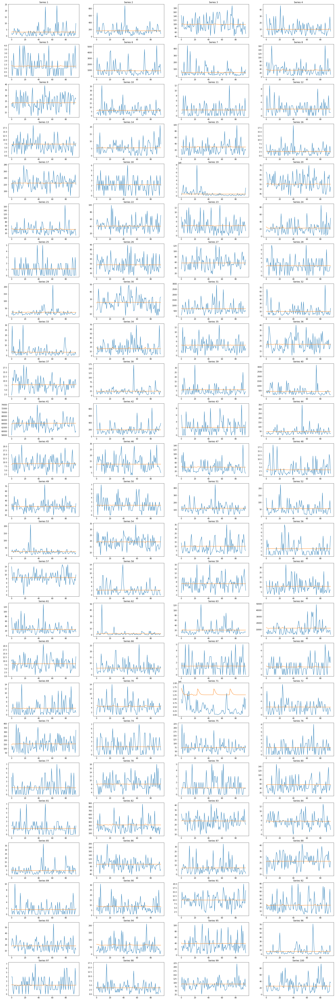

In [23]:
plot_fit(test_data, rnn_prediction, predicted=True, cols=4)

In [24]:
rnn_metrics, rnn_statistics = get_model_metrics(
    test_data=test_data,
    predicted_values=rnn_prediction,
    train_data=train_data,
    m=1,
    model_name="recurrent_neural_network",
    case=case
)
metrics.update(rnn_metrics)
metrics_statistics.update(rnn_statistics)

## Transformer model

In [25]:
with open(os.path.join(case_path, "transformer_scaler.pkl"), "rb") as file:
    transformer_scaler = pickle.load(file)

In [26]:
transformer_model = tf.keras.models.load_model(os.path.join(case_path, "transformer.tf"))

In [27]:
forecaster = Forecaster(transformer_scaler, transformer_model)

In [28]:
t_input_steps = 24
inputs = train_data[-t_input_steps:]

In [29]:
transformer_prediction = forecaster(inputs=inputs, steps=24)

In [30]:
inputs = train_data[-t_input_steps:]
initial_prediction = forecaster(inputs=inputs, steps=24)
current_prediction = initial_prediction
transformer_prediction = current_prediction
for _ in range(3):
    current_prediction =forecaster(inputs=current_prediction, steps=24)
    transformer_prediction = np.concatenate([transformer_prediction, current_prediction], axis=0)

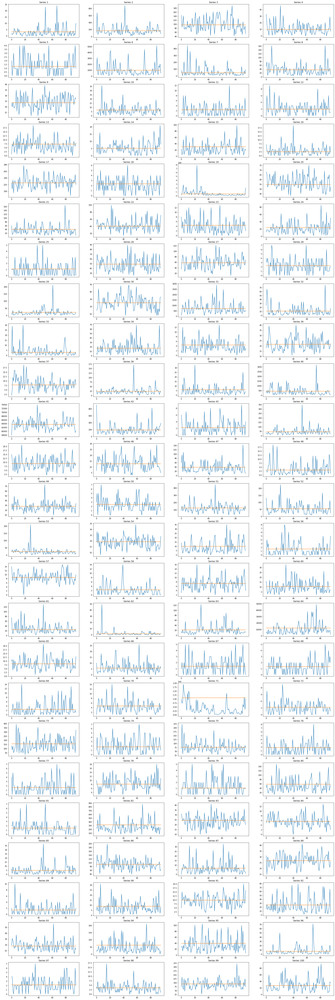

In [31]:
plot_fit(test_data, transformer_prediction, predicted=True, cols=4)

In [32]:
transformer_metrics, transformer_statistics = get_model_metrics(
    test_data=test_data,
    predicted_values=transformer_prediction,
    train_data=train_data,
    m=1,
    model_name="transformer",
    case=case
)
metrics.update(transformer_metrics)
metrics_statistics.update(transformer_statistics)

## Metrics results

In [33]:
pd.DataFrame(metrics_statistics)

sarima           poisson_autorregression       \
                  sMAPE      MASE                   sMAPE MASE   
case_4 mean   59.516632  0.759918                     NaN  NaN   
       sd     25.986069  0.257228                     NaN  NaN   
       min     3.616365  0.363482                     NaN  NaN   
       max   124.234719  3.142505                     NaN  NaN   

            poisson_autorregression_adjusted            \
                                       sMAPE      MASE   
case_4 mean                        57.924114  0.780402   
       sd                          26.181970  0.336285   
       min                          7.154025  0.524921   
       max                        138.345042  3.614484   

            recurrent_neural_network           transformer            
                               sMAPE      MASE       sMAPE      MASE  
case_4 mean                57.652452  0.727359   57.708608  0.726717  
       sd                  24.558129  0.096342   24.378138  0.089266  
       min                  3.712794  0.523615    3.603364  0.533855  
       max                118.763306  1.220302  109.854791  1.239906

In [34]:
with open("metrics.pkl", "wb") as outfile:
    pickle.dump(metrics, outfile)

with open("statistics.pkl", "wb") as outfile:
    pickle.dump(metrics_statistics, outfile)